# 2. Image Enhancement

## Table of Contents
1. [Libraries](#libraries)
2. [Histogram Equalization](#hist)
3. [Denoising with Filters](#denoising)
4. [Challenge](#challenge)
5. [Ejercicio 1](#ej1)
6. [Ejercicio 2](#ej2)
7. [Ejercicio 3](#ej3)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
# Install image-slicer library
# pip install image-slicer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.1/39.1 MB 16.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for Pillow: filename=Pillow-7.2.0-cp310-cp310-linux_x86_64.whl size=1140104 sha256=4292a1d7046ddbe3deee2b1d58c33bd0b1a9885fbf06a74cf4da4206af04c9a9
  Stored in directory: /root/.cache/pip/wheels/fd/5c/a6/0ab3157e7e4a0ba139bd89cb1edbe0f87876cf55ef31b05d6a
Successfully built Pillow
  Attempting uninstall: Pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.13 requires pillow>=9.0.0, but you have pillow 7.2.0 which is incompatible.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 7.2.0 which is incompatible.


In [ ]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from skimage import exposure
import skimage
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med
import cv2

<ipython-input-1-0238ad4d13f7>:7: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter as gauss
<ipython-input-1-0238ad4d13f7>:8: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter as med


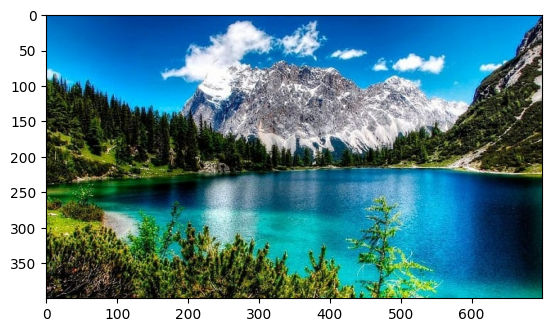

In [ ]:
original_image = Image.open('data/image.jpg')
plt.imshow(original_image)
type(original_image)

# Save the image
np.save('/data/img.npy', original_image)

#Load the image
original_image = np.load('/data/img.npy')

## Histogram Equalization<a class="anchor" id="hist" ></a>

Let's look at the distribution of pixel values in the image.

Ideally, the image should have relatively even distribution of values, indicating good contrast and making it easier to extract analytical information.

An easy way to check this is to plot a histogram.

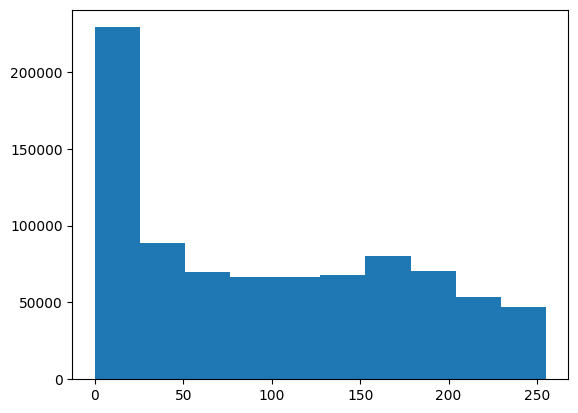

In [ ]:
# Plot a histogram - we need to use ravel to "flatten" the 3 dimensions
plt.hist(original_image.ravel())
plt.show()

Another useful way to visualize the statistics of an image is as a cumulative distribution function (CDF) plot. Which shows the cumulative pixel intensity frequencies from 0 to 255.

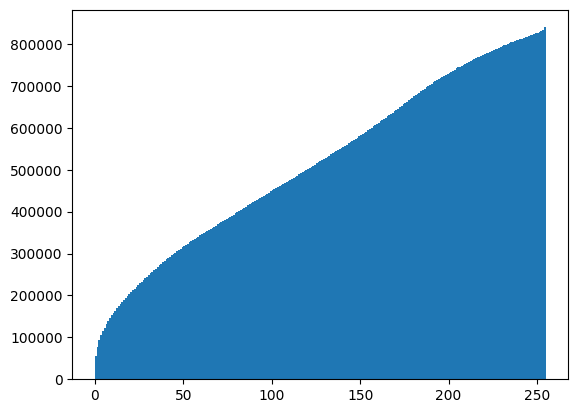

In [ ]:
plt.hist(original_image.ravel(), bins=255, cumulative=True)
plt.show()

The histogram and CDF for our image show pretty uneven distribution - there's a lot of contrast in the image. Ideally we should equalize the values in the images we want to analyse to try to make our images more consistent in terms of the shapes they contain irrespective of light levels.

Histogram equalization is often used to improve the statistics of images. In simple terms, the histogram equalization algorithm attempts to adjust the pixel values in the image to create a more uniform distribution. The code in the cell below uses the  **exposure.equalize_hist** method from the **skimage** package to equalize the image.  

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


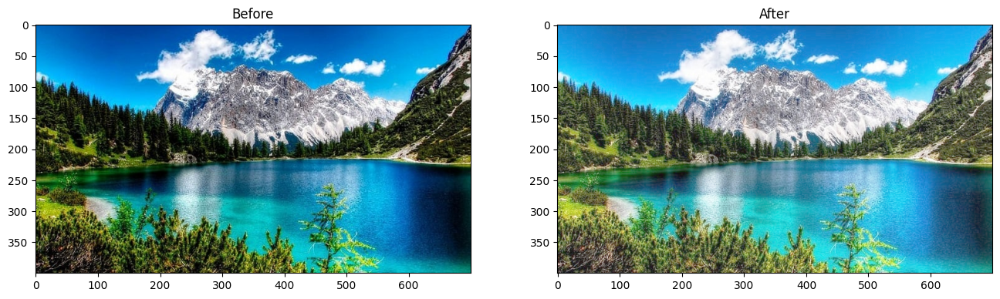

In [ ]:
original_image_eq = exposure.equalize_hist(original_image)

fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(original_image_eq)
a.set_title('After')

plt.show()

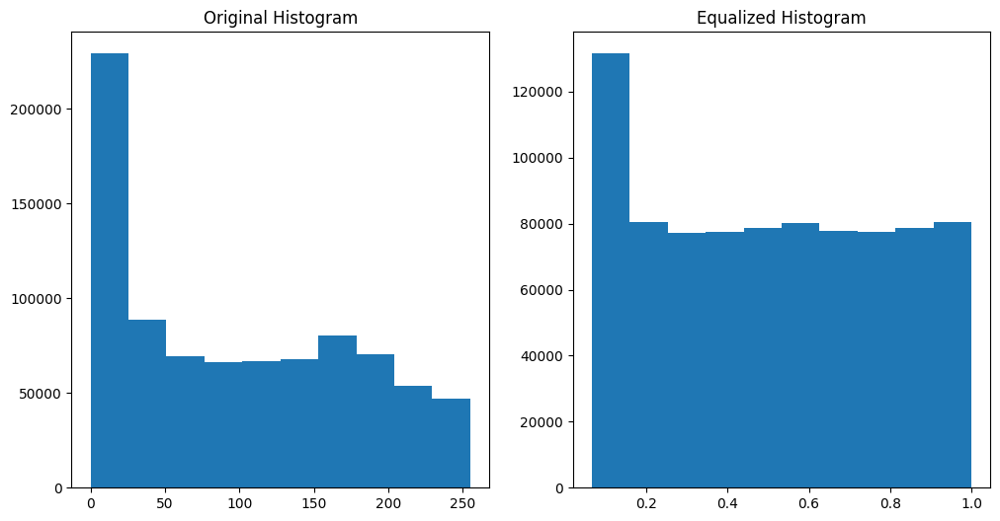

In [ ]:
fig = plt.figure(figsize=(12, 6))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(original_image.ravel())
a.set_title('Original Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(original_image_eq.ravel())
a.set_title('Equalized Histogram')

plt.show()

As with most image operations, there's more than one way to do this. For example, you could also use the **PIL.ImgOps.equalize** method:

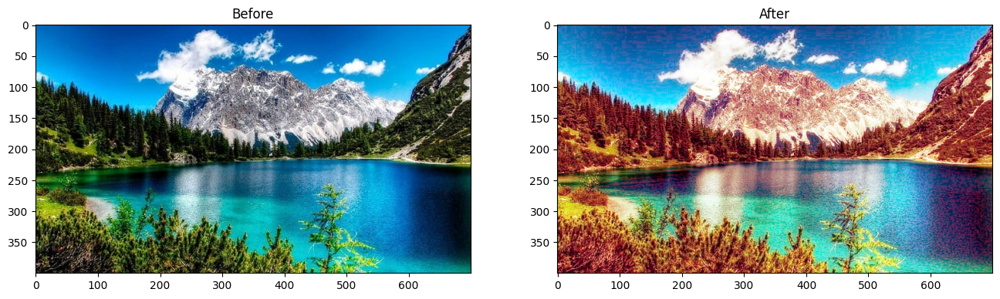

In [ ]:

# Equalize the image - but we need to convert the numpy array back to the PIL image format
image_PIL_eq = ImageOps.equalize(Image.fromarray(original_image))

# Display using matplotlib

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(image_PIL_eq)
a.set_title('After')

plt.show()

Now let's see what that's done to the histogram and CDF plots:

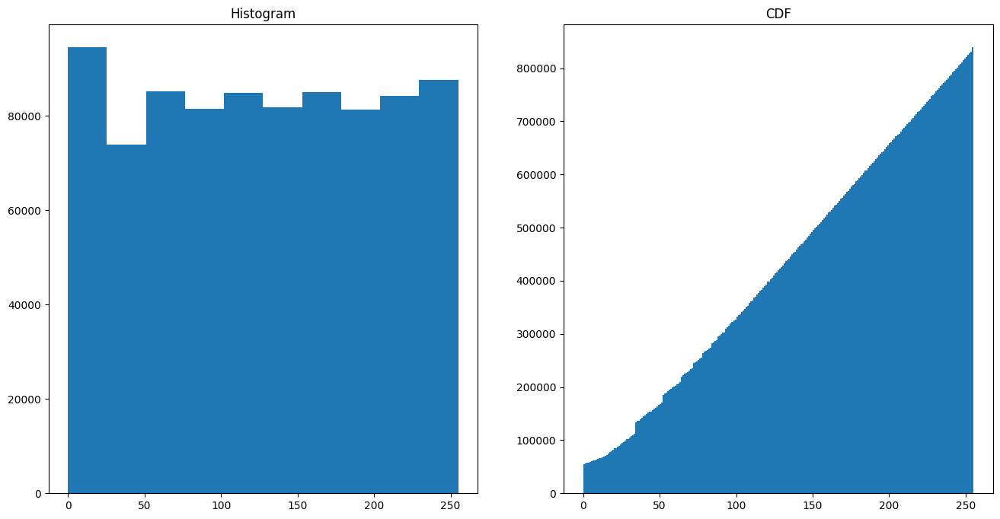

In [ ]:
# Display histograms
img_eq = np.array(image_PIL_eq)

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(img_eq.ravel())
a.set_title('Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(img_eq.ravel(), bins=255, cumulative=True)
a.set_title('CDF')

plt.show()

The pixel intensities are more evenly distributed in the equalized image. In particular, the cumulative density shows a straight diagonal cumulation; which is a good sign that the pixel intensity values have been equalized.

## Denoising with Filters <a class="anchor" id="denoising" ></a>

Often images need to be cleaned up to remove "salt and pepper" noise.

### Add Some Random Noise
Let's add some random noise to our image - such as you might see in a photograph taken in low light or at a low resolution.

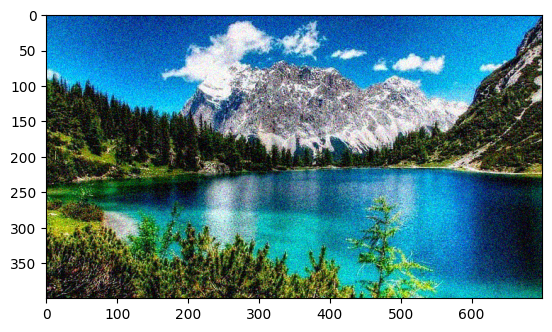

In [ ]:
img_n = skimage.util.random_noise(original_image)
plt.imshow(img_n)

### Using a Gaussian Filter
A Gaussian filter applies a weighted average (mean) value for pixels based on the pixels that surround them.

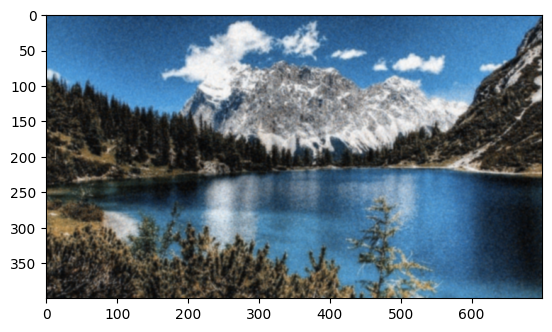

In [ ]:
img3_gauss = gauss(img_n, sigma=1)
plt.imshow(img3_gauss)

### Using a Median Filter
The Gaussian filter results in a blurred image, which may actually be better for feature extraction as it makes it easier to find contrasting areas. If it's too blurred, we could try a median filter, which as the name suggests applies the median value to pixels based on the pixels around them.

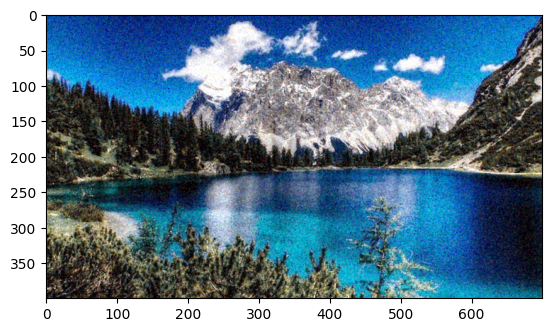

In [ ]:
img_med = med(img_n, size=2)
plt.imshow(img_med)

## Challenge <a class="anchor" id="challenge" ></a>

Now, try solving this challenge, you must equalize different windows of the same image in a splitted way.

In [ ]:
# from image_slicer import slice

n = 4
# slice('/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image.jpg', n)

(<Tile #1 - image_01_01.png>,
 <Tile #2 - image_01_02.png>,
 <Tile #3 - image_02_01.png>,
 <Tile #4 - image_02_02.png>)

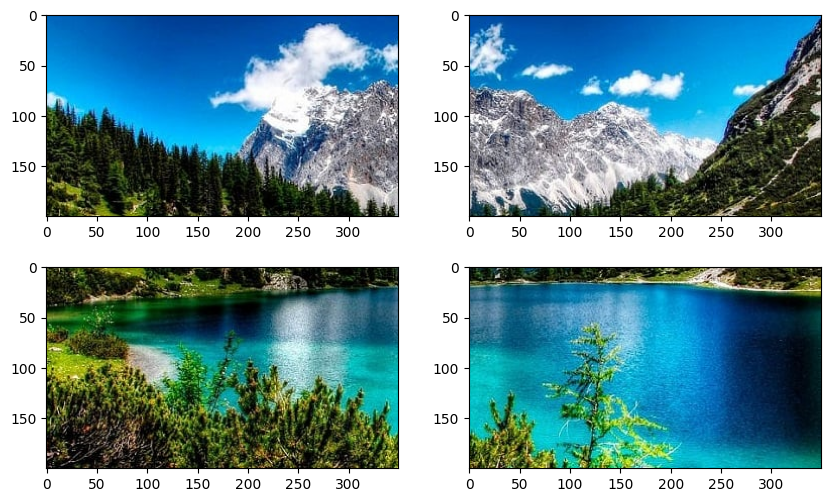

In [ ]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
img = Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_01_01.png')
plt.imshow(img)

plt.subplot(2,2,2)
img = Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_01_02.png')
plt.imshow(img)

plt.subplot(2,2,3)
img = Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_02_01.png')
plt.imshow(img)

plt.subplot(2,2,4)
img = Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_02_02.png')
plt.imshow(img)

plt.show()

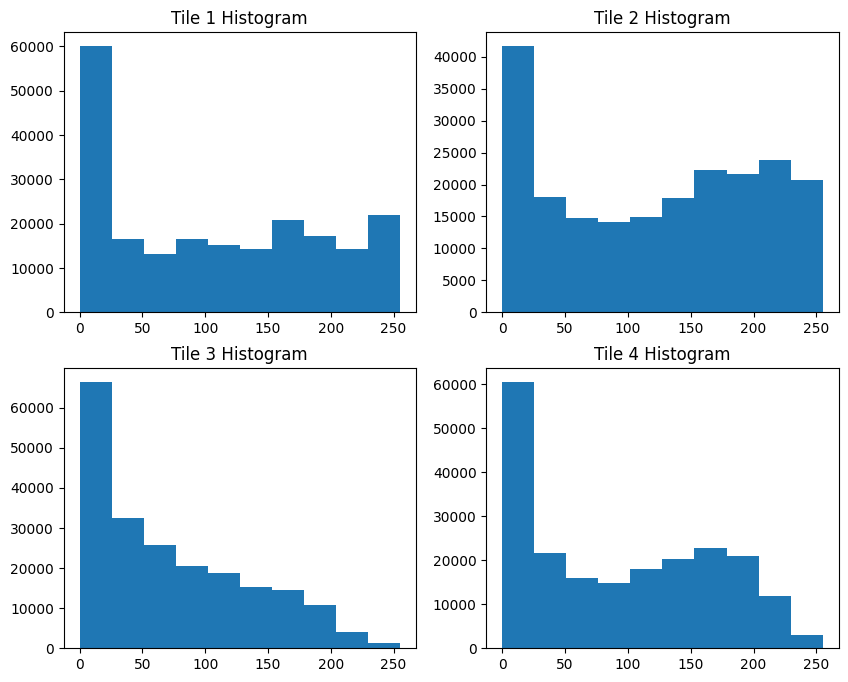

In [ ]:
tile_1 = np.array(Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_01_01.png'))
tile_2 = np.array(Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_01_02.png'))
tile_3 = np.array(Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_02_01.png'))
tile_4 = np.array(Image.open(f'/content/drive/Shareddrives/Equipo 12 - Vision/RepoGithub/data/image_02_02.png'))

fig = plt.figure(figsize=(10, 8))

# Subplot for tile 1 image
a=fig.add_subplot(2,2,1)
imgplot = plt.hist(tile_1.ravel())
a.set_title('Tile 1 Histogram')

# Subplot for tile 2 image
a=fig.add_subplot(2,2,2)
imgplot = plt.hist(tile_2.ravel())
a.set_title('Tile 2 Histogram')

# Subplot for tile 3 image
a=fig.add_subplot(2,2,3)
imgplot = plt.hist(tile_3.ravel())
a.set_title('Tile 3 Histogram')

# Subplot for tile 4 image
a=fig.add_subplot(2,2,4)
imgplot = plt.hist(tile_4.ravel())
a.set_title('Tile 4 Histogram')

plt.show()

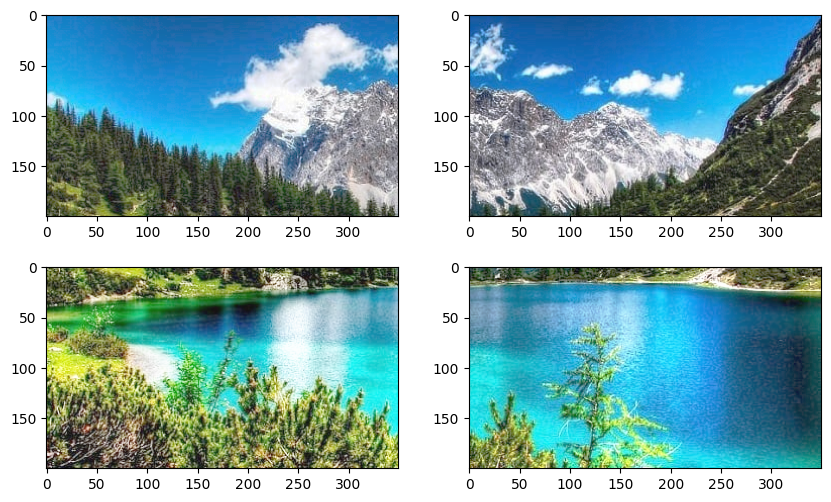

In [ ]:
# Equalize image in each tile
tile_1_eq = exposure.equalize_hist(tile_1)
tile_2_eq = exposure.equalize_hist(tile_2)
tile_3_eq = exposure.equalize_hist(tile_3)
tile_4_eq = exposure.equalize_hist(tile_4)

fig = plt.figure(figsize=(10, 6))

# Subplot for tile 1 image
a=fig.add_subplot(2,2,1)
imgplot = plt.imshow(tile_1_eq)

# Subplot for tile 2 image
a=fig.add_subplot(2,2,2)
imgplot = plt.imshow(tile_2_eq)

# Subplot for tile 3 image
a=fig.add_subplot(2,2,3)
imgplot = plt.imshow(tile_3_eq)

# Subplot for tile 4 image
a=fig.add_subplot(2,2,4)
imgplot = plt.imshow(tile_4_eq)

plt.show()

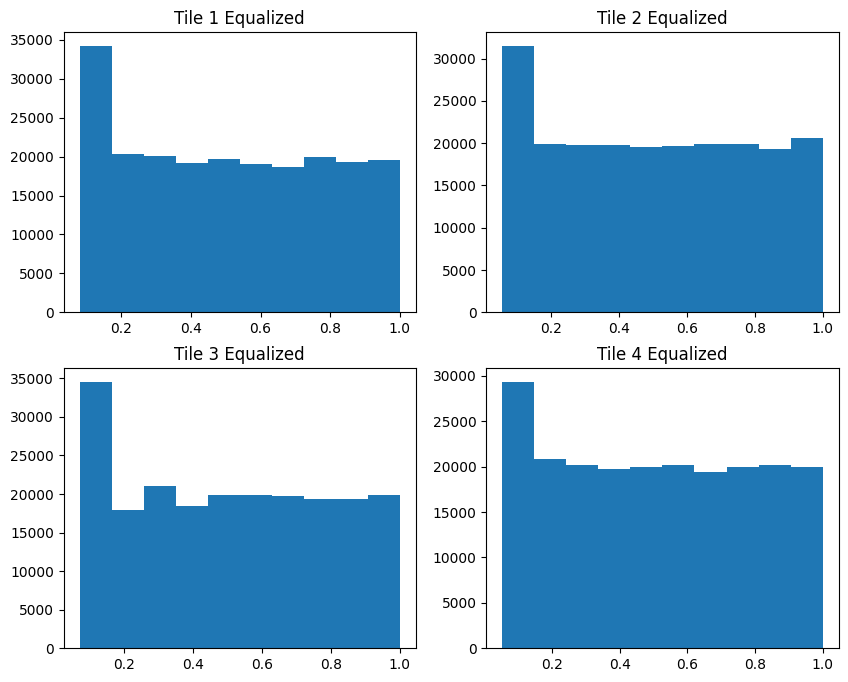

In [ ]:
fig = plt.figure(figsize=(10, 8))

# Subplot for tile 1 image
a=fig.add_subplot(2,2,1)
imgplot = plt.hist(tile_1_eq.ravel())
a.set_title('Tile 1 Equalized')

# Subplot for tile 2 image
a=fig.add_subplot(2,2,2)
imgplot = plt.hist(tile_2_eq.ravel())
a.set_title('Tile 2 Equalized')

# Subplot for tile 3 image
a=fig.add_subplot(2,2,3)
imgplot = plt.hist(tile_3_eq.ravel())
a.set_title('Tile 3 Equalized')

# Subplot for tile 4 image
a=fig.add_subplot(2,2,4)
imgplot = plt.hist(tile_4_eq.ravel())
a.set_title('Tile 4 Equalized')

plt.show()

## Ejercicio 1 <a class="anchor" id="ej1" ></a>

Investiga e implementa el método tile-based histogram equalization. En estos métodos, la imagen se particiona en diferentes ventanas (i.e. mosaicos) y los histogramas se calculan de forma independiente, aplicando la corrección sobre cada ventana. Existe un compromiso entre el tamaño de la ventana y la complejidad computacional, por lo cual es más complejo que el método simple. Implementa esta versión y realiza algunas pruebas variando el tamaño de la ventana. Otro inconveniente es que se puede observar posibles diferencias entre los el contraste de los bloques, ¿cómo podría mejorarse?

<function matplotlib.pyplot.show(close=None, block=None)>

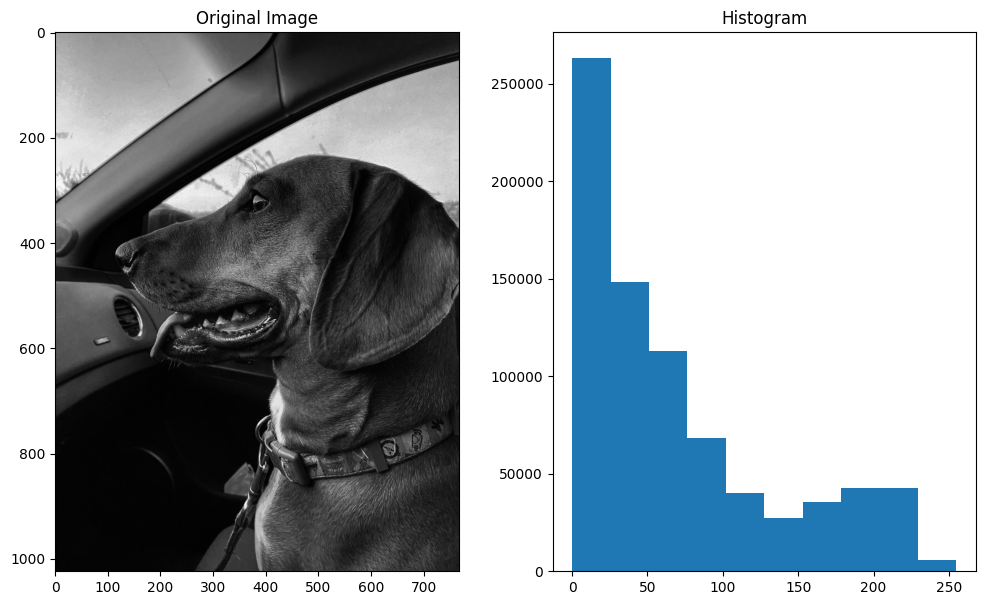

In [ ]:
or_image = cv2.imread('data/nico.jpeg', cv2.IMREAD_GRAYSCALE)

fig = plt.figure(figsize=(12, 7))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(cv2.cvtColor(or_image, cv2.COLOR_BGR2RGB))
a.set_title('Original Image')

# Subplot for image histogram
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(or_image.ravel())
a.set_title('Histogram')

plt.show

En la libreria OpenCV para Python, la función `createCLAHE` con los parametros `tileGridSize` y `clipLimit`, implementa el algoritmo CLAHE solicitado en el Ejercicio 3.  

Sin embargo, asignar un valor alto (mayor a 1000 por ejemplo) al parametro `clipLimit` equivale a implementar el método AHE, es decir sin limitar el contraste. AHE divide la imagen en ventanas y realiza la correccion del historama en cada una de estas ventanas.

Una mejora a este método es el algoritmo CLAHE, sobre el cual proporcionamos una descripción de su funcionamiento al final del Ejercicio 3.

In [ ]:
# Tamaño de ventana = 4x4
ahe1 = cv2.createCLAHE(clipLimit=2000.0, tileGridSize=(4,4))
ah1 = ahe1.apply(or_image)

# Tamaño de ventana = 8x8
ahe2 = cv2.createCLAHE(clipLimit=2000.0, tileGridSize=(8,8))
ah2 = ahe2.apply(or_image)

# Tamaño de ventana = 16x16
ahe3 = cv2.createCLAHE(clipLimit=2000.0, tileGridSize=(16,16))
ah3 = ahe3.apply(or_image)

<function matplotlib.pyplot.show(close=None, block=None)>

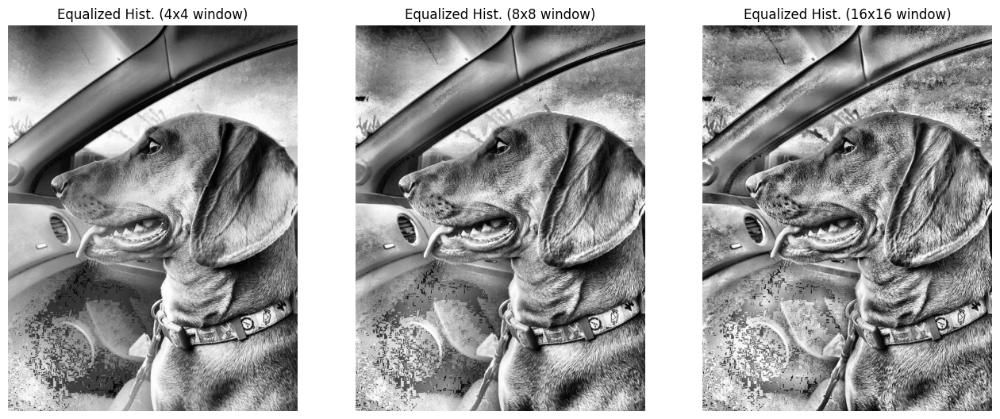

In [ ]:
fig = plt.figure(figsize=(16, 14))

# Subplot for equalized image
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(cv2.cvtColor(ah1, cv2.COLOR_BGR2RGB))
a.set_title('Equalized Hist. (4x4 window)')
a.axis('off')

# Subplot for equalized image
a=fig.add_subplot(1,3,2)
imgplot = plt.imshow(cv2.cvtColor(ah2, cv2.COLOR_BGR2RGB))
a.set_title('Equalized Hist. (8x8 window)')
a.axis('off')

# Subplot for equalized image
a=fig.add_subplot(1,3,3)
imgplot = plt.imshow(cv2.cvtColor(ah3, cv2.COLOR_BGR2RGB))
a.set_title('Equalized Hist. (16x16 window)')
a.axis('off')

plt.show

## Ejercicio 2 <a class="anchor" id="ej2" ></a>

Investiga e implementa un método sencillo del Sliding Window Adaptive Histogram Equalization (SWAHE) y compara algunas imágenes con diferentes tipos de imágenes.




### **Sliding Window Adaptive Histogram Equalization (SWAHE)**

La Ecualización del Histograma es una técnica de procesamiento de imágenes utilizada para mejorar el contraste al redistribuir las intensidades de píxeles en una imagen, su objetivo es obtener una distribución de intensidades más uniforme lo que suele resultar en imágenes con un mejor contraste visual, el termino "Sliding Window" (ventana deslizante) implica que la adaptación del histograma se realiza de manera local y en regiones más pequeñas de la imagen en lugar de aplicarse a toda la imagen, esto puede ser beneficioso en situaciones en las que las condiciones de iluminación varían significativamente en diferentes partes de la imagen, el término "Adaptive" se refiere a que el proceso de ecualización se ajusta dinámicamente a las características locales de la imagen en lugar de utilizar un enfoque global, la adaptabilidad puede lograrse mediante el uso de una ventana deslizante que se mueve a lo largo de la imagen calculando y aplicando la ecualización del histograma en regiones locales siendo útil en situaciones donde hay cambios bruscos en la iluminación o en la distribución de intensidades dentro de una imagen por lo que preserva mejor los detalles y mejorar el contraste de manera más específica en regiones específicas de la imagen.


El uso de SWAHE puede ser beneficioso en casos como:
* Fotografías Médicas
* Imágenes telescópicas
* Restauración de imágenes




### Ejercicio 2a

In [ ]:
"""
Takes the image as the input and returns the depth(8 bit, 16 bit etc.)
"""
def get_depth(im):
    deptStr = im.dtype
#if type is uintX then the depth is X(like uint8,uint16 etc.), so we split it
    return (2**int((str(deptStr).rsplit('uint',1))[1]))

'''
Takes image as input, controls if image is gray or not. Returns true or false.
'''
def is_gray(im):
#if image is gray, return true
    if len(im.shape) < 3 or im.shape[2]  == 1:
        return True
#get the channels and check them, if all the channels are equal then it is a grayscale image
    b,g,r = im[:,:,0], im[:,:,1], im[:,:,2]
    if (b==g).all() and (b==r).all():
        return True
#else it is not gray
    return False

'''
Takes image as input, reduces channel size to one if image is gray.Returns a gray image.
'''
def correct_gray(im):
#if channel size is normal(only width and height) return image
    if len(im.shape) < 3 or im.shape[2]  == 1:
        return im
#if channel size >= 3 fix it by converting to gray using classical rgb to gray formula
    else:
        return im[:,:,0]

'''
Takes image as input, converts image to YCbCr using RGB->YCrCb formula. Returns new YUV image.
'''
def rgb2ycbcr(im):
#define coefficients as a numpy array
    coef = np.array([[.299, .587, .114], [-.1687, -.3313, .5], [.5, -.4187, -.0813]])
#get the dot product of image and coefficients for conversion
    ycbcr = im.dot(coef.T)
#Add 128 to Cr and Cb channels
    ycbcr[:,:,[1,2]] += 128
#return new YCrCb image
    return np.uint8(ycbcr)

'''
Takes image as input, converts image to RGB using YUV->RGB formula. Returns new BGR image.
'''
def ycbcr2rgb(im):
#define coefficients as a numpy array
    xform = np.array([[1, 0, 1.402], [1, -0.34414, -.71414], [1, 1.772, 0]])
#convert to float in order to prevent computation errors
    rgb = im.astype(np.float)
#Subtract 128 from Cr and Cb channels
    rgb[:,:,[1,2]] -= 128
#get the dot product of image and coefficients for conversion
    rgb = rgb.dot(xform.T)
#if the values are bigger than 255 change it as 255
    np.putmask(rgb, rgb > 255, 255)
#if the values are smaller than 0 change it as 0
    np.putmask(rgb, rgb < 0, 0)
#return RGB image
    return np.uint8(rgb)

'''
Converts BGR image to RGB and returns the new RGB image
'''
def bgr2rgb(im):
    h, w, ch = im.shape
    new_im = np.zeros((h, w, ch))
    new_im[:,:,0], new_im[:,:,1], new_im[:,:,2] = im[:,:,2], im[:,:,1], im[:,:,0]
    return np.uint8(new_im)
'''
Takes image as input, converts image to YCbCr using RGB->YCrCb formula. Returns new YUV image.
'''
def rgb2ycbcr(im):
#define coefficients as a numpy array
    coef = np.array([[.299, .587, .114], [-.1687, -.3313, .5], [.5, -.4187, -.0813]])
#get the dot product of image and coefficients for conversion
    ycbcr = im.dot(coef.T)
#Add 128 to Cr and Cb channels
    ycbcr[:,:,[1,2]] += 128
#return new YCrCb image
    return np.uint8(ycbcr)

'''
Takes the image list, image names and num. of levels as input
Plots the images, returns nothing.
'''
def im_plot(im_list, names, levels):
#define figures, axes and image counter i
    fig, ax = plt.subplots(1,len(im_list),figsize=(10, 8))
    i = 0
#show images together using subplot
    for im in im_list:
        i = i + 1
#if gray, handle
        if is_gray(im):
            im_new = im
            plt_str = int("1" + str(len(im_list)) + str(i))
            plt.subplot(plt_str)
#map it to gray
            plt.imshow(im_new, cmap='gray')
            plt.title(names[i-1])
            plt.axis('off')
#if color, handle
        else:
            im_new = bgr2rgb(im)
            plt_str = int("1" + str(len(im_list)) + str(i))
            plt.subplot(plt_str)
            plt.imshow(im_new)
            plt.title(names[i-1])
            plt.axis('off')
#show
    plt.show()

'''
Takes the image list, image names and num. of levels as input
Plots the image histograms, returns nothing.
'''
def hist_plot(im_list, names, levels):
#define figures, axes and image counter i
    fig, ax = plt.subplots(1,len(im_list),figsize=(10, 8))
    i = 0
#show histograms of the images together using subplot
    if is_gray(im_list[0]):
        for im in im_list:
            i = i + 1
            plt_str = int("1" + str(len(im_list)) + str(i))
            plt.subplot(plt_str)
#use plt.hist for histograms
            plt.hist(im_list[i-1].ravel(), levels,[0, levels])
            plt.title(names[i-1])
#limit max and min values
            plt.xlim([0,levels])
        plt.show()
#if it is a color image, take the 3 channels
    else:
        color = ('b','g','r')
        for j in range(0, len(im_list)):
            for i,col in enumerate(color):
                plt_str = int("1" + str(len(im_list)) + str(j+1))
                plt.subplot(plt_str)
                histr = cv2.calcHist([im_list[j]],[i],None,[levels],[0,levels])
                plt.plot(histr,color = col)
                plt.xlim([0,levels])
                plt.title(names[j])
    plt.show()

"""
Applies histogram sliding on an image. Takes image, levels, value and direction(ctrl) as parameters.
Returns the new image
"""
def hist_slide(im, levels, val, ctrl):
#create the output image
    im_out = np.zeros((im.shape[0],im.shape[1],3), dtype=np.uint8)
#slide the histogram while maintaining the boundaries
    if is_gray(im):
        im = correct_gray(im)
        im_out = im.copy()
        if(ctrl == 'inc'):
            lim = 255 - val
            im_out[im_out > lim] = 255
            im_out[im_out <= lim] += val
        else:
            lim = 0 + val
            im_out[im_out < lim] = 0
            im_out[im_out >= lim] -= val
    else:
        img = rgb2ycbcr(im)
        im_out = img.copy()
        dMat = img[:,:,0]
        if(ctrl == 'inc'):
            lim = 255 - val
            dMat[dMat > lim] = 255
            dMat[dMat <= lim] += val
        else:
            lim = 0 + val
            dMat[dMat < lim] = 0
            dMat[dMat >= lim] -= val
        im_out[:,:,0] = dMat
        im_out = ycbcr2rgb(im_out)
    return np.uint8(im_out)


<ipython-input-36-6661f1ab9494>:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  rgb = im.astype(np.float)


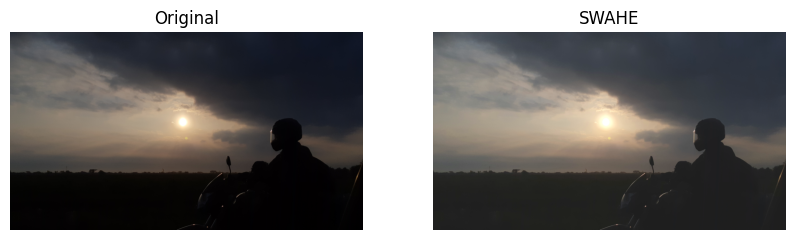

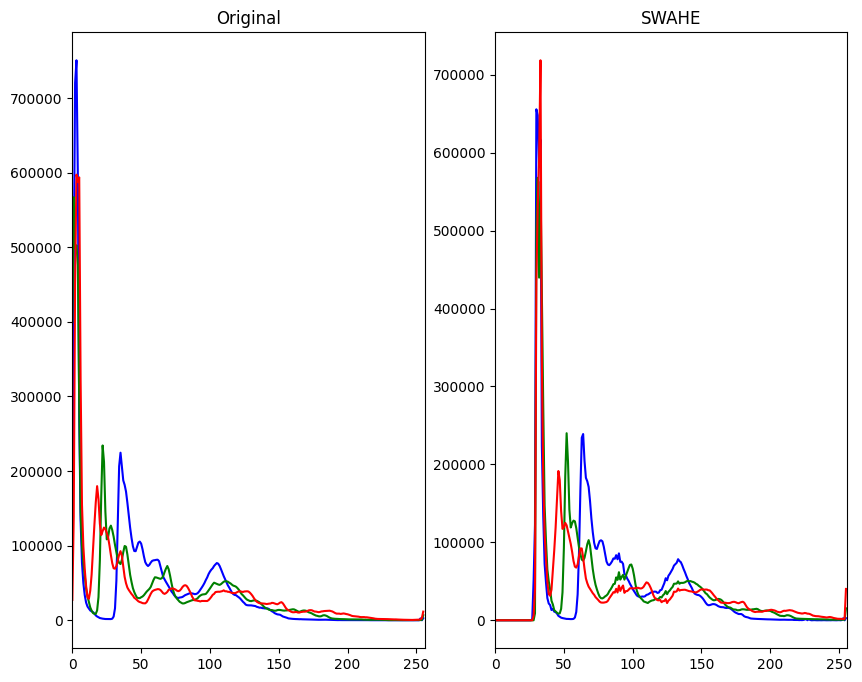

In [ ]:
#im = cv2.imread('/content/drive/Shareddrives/Equipo 12 - Vision/data/20200210_070613.jpg', cv2.IMREAD_GRAYSCALE)
im = cv2.imread('/data/20200210_070613.jpg', cv2.COLOR_BGR2RGB)
levels = get_depth(im)
#out = hist_slide(im, levels, 150, 'dec')
out = hist_slide(im, levels, 30, 'inc')
#give the names for the titles of the images
names = ['Original', 'SWAHE']
#create image list
im_list = [im,out]
#show images and their histograms
im_plot(im_list , names , levels)
hist_plot(im_list , names , levels)

### Ejercicio 2b

<ipython-input-36-6661f1ab9494>:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  rgb = im.astype(np.float)


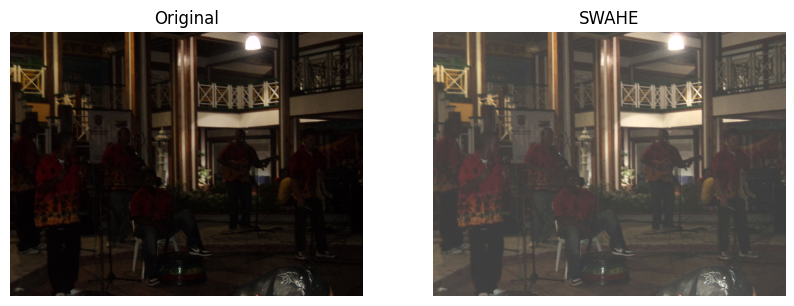

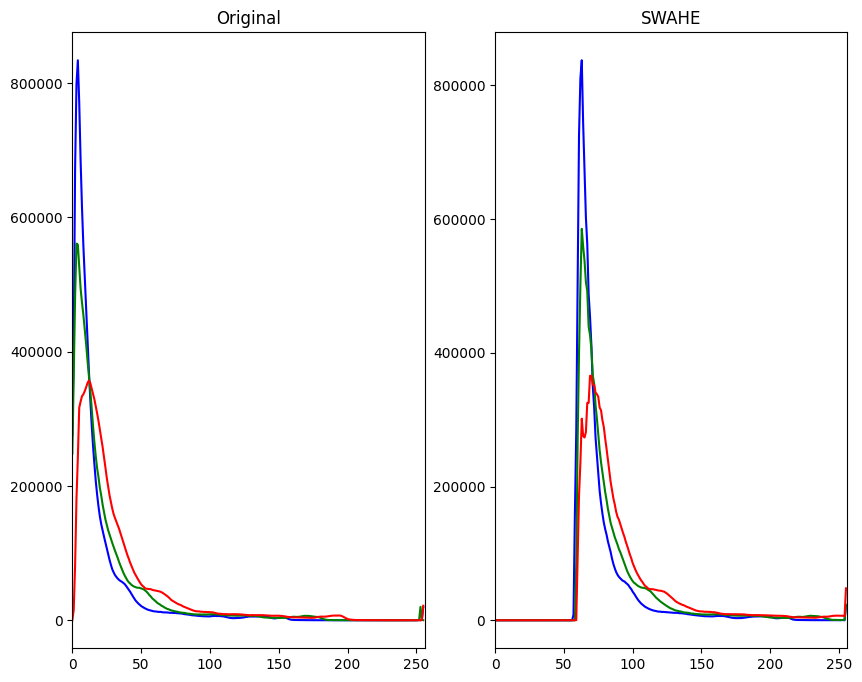

In [ ]:
#im = cv2.imread('/content/drive/Shareddrives/Equipo 12 - Vision/data/DSC07495.JPG', cv2.IMREAD_GRAYSCALE)
im = cv2.imread('/data/DSC07495.JPG', cv2.COLOR_BGR2RGB)
levels = get_depth(im)
#out = hist_slide(im, levels, 30, 'dec')
out = hist_slide(im, levels, 60, 'inc')
#give the names for the titles of the images
names = ['Original', 'SWAHE']
#create image list
im_list = [im,out]
#show images and their histograms
im_plot(im_list , names , levels)
hist_plot(im_list , names , levels)

### Ejercicio 2c

<ipython-input-36-6661f1ab9494>:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  rgb = im.astype(np.float)


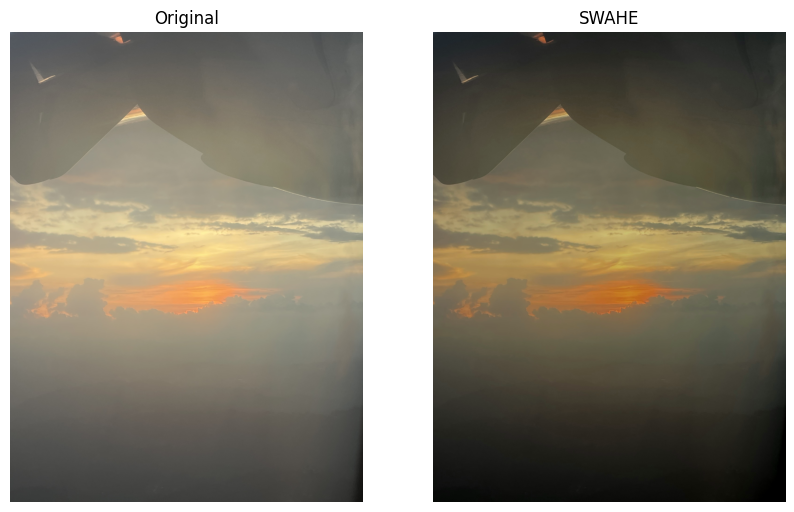

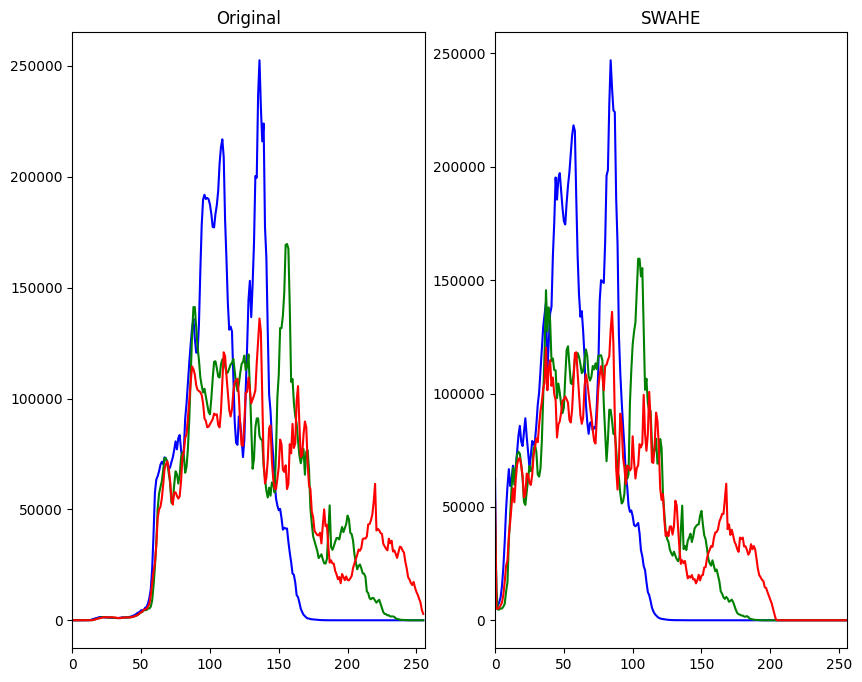

In [ ]:
#im = cv2.imread('/content/drive/Shareddrives/Equipo 12 - Vision/data/IMG_7067.jpg', cv2.IMREAD_GRAYSCALE)
im = cv2.imread('data/IMG_7067.jpg', cv2.COLOR_BGR2RGB)
levels = get_depth(im)
out = hist_slide(im, levels, 50, 'dec')
#out = hist_slide(im, levels, 40, 'inc')
#give the names for the titles of the images
names = ['Original', 'SWAHE']
#create image list
im_list = [im,out]
#show images and their histograms
im_plot(im_list , names , levels)
hist_plot(im_list , names , levels)

## Ejercicio 3 <a class="anchor" id="ej3" ></a>

Investiga cómo funciona el algoritmo CLAHE (contrast limited adaptive histogram equalization) y realiza una implementación (puede ser usando la implementación de OpenCV). Prueba sobre diferentes tipos de imágenes y compara con el método de ecualización de histogramas básico. Provee una breve descripción del método a partir de una  investigación bibliográfica.

### Ejercicio 3a

<function matplotlib.pyplot.show(close=None, block=None)>

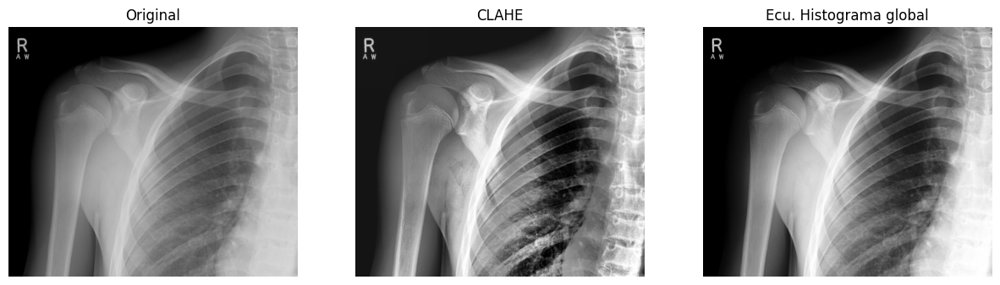

In [ ]:
image2 = cv2.imread('/data/xray.jpeg', cv2.IMREAD_GRAYSCALE)

#CLAHE
clahe = cv2.createCLAHE(clipLimit=20.0, tileGridSize=(4,4))
cl1 = clahe.apply(image2)

#Equalizacion hist. global
equ1 = cv2.equalizeHist(image2)

fig = plt.figure(figsize=(15, 12))

a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
a.set_title('Original')
a.axis('off')

a=fig.add_subplot(1,3,2)
imgplot = plt.imshow(cv2.cvtColor(cl1, cv2.COLOR_BGR2RGB))
a.set_title('CLAHE')
a.axis('off')

a=fig.add_subplot(1,3,3)
imgplot = plt.imshow(cv2.cvtColor(equ1, cv2.COLOR_BGR2RGB))
a.set_title('Ecu. Histograma global')
a.axis('off')

plt.show

### Ejercicio 3b

<function matplotlib.pyplot.show(close=None, block=None)>

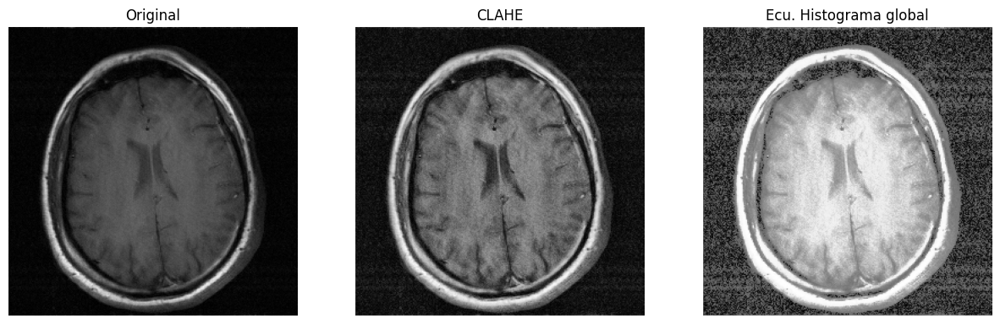

In [ ]:
image3 = cv2.imread('data/mag.jpg', cv2.IMREAD_GRAYSCALE)

#CLAHE
clahe2 = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl2 = clahe2.apply(image3)

#Equalizacion hist. global
equ2 = cv2.equalizeHist(image3)

fig = plt.figure(figsize=(15, 10))

a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
a.set_title('Original')
a.axis('off')

a=fig.add_subplot(1,3,2)
imgplot = plt.imshow(cv2.cvtColor(cl2, cv2.COLOR_BGR2RGB))
a.set_title('CLAHE')
a.axis('off')

a=fig.add_subplot(1,3,3)
imgplot = plt.imshow(cv2.cvtColor(equ2, cv2.COLOR_BGR2RGB))
a.set_title('Ecu. Histograma global')
a.axis('off')

plt.show

### Ejercicio 3c

<function matplotlib.pyplot.show(close=None, block=None)>

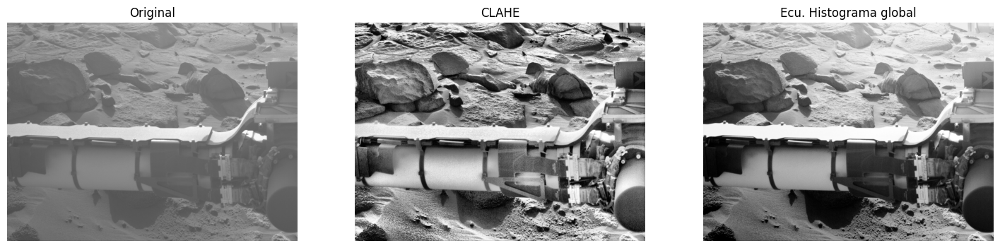

In [ ]:
image4 = cv2.imread('data/mars_perseverance.jpg', cv2.IMREAD_GRAYSCALE)

#CLAHE
clahe3 = cv2.createCLAHE(clipLimit=20.0, tileGridSize=(6,6))
cl3 = clahe3.apply(image4)

#Equalizacion hist. global
equ3 = cv2.equalizeHist(image4)

fig = plt.figure(figsize=(18, 18))

a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
a.set_title('Original')
a.axis('off')

a=fig.add_subplot(1,3,2)
imgplot = plt.imshow(cv2.cvtColor(cl3, cv2.COLOR_BGR2RGB))
a.set_title('CLAHE')
a.axis('off')

a=fig.add_subplot(1,3,3)
imgplot = plt.imshow(cv2.cvtColor(equ3, cv2.COLOR_BGR2RGB))
a.set_title('Ecu. Histograma global')
a.axis('off')

plt.show

### Contrast Limited Adaptive Histogram Equalization

El algoritmo **CLAHE** es una mejora del algoritmo AHE (Adaptive Histogram Equalization), el cual implementamos en el ejercicio 1 de esta actividad. El algoritmo AHE divide la imagen en “ventanas”, también llamadas región de contexto (*contextual region*). Para cada ventana se calcula su histograma y posteriormente la función de transformación con la cual se ecualiza el histograma “local” de cada región de contexto. De esta manera se obtiene una imagen cuyo contraste fue optimizado por regiones, a diferencia del método básico en el que se ecualiza el histograma de la imagen completa. Una desventaja del método AHE es que incrementa el “ruido” de la imagen en regiones donde las intensidades de los pixeles son casi uniformes.

Para corregir este problema, el algoritmo **CLAHE** “recorta” (*clipping*) la altura del histograma (recordamos que picos altos en un histograma representan regiones casi uniformes), de esta manera se limita el ajuste de contraste específicamente en áreas uniformes de la imagen.

Cuando el ajuste de contraste se reduce en una región, se debe incrementar en otras áreas para que el rango completo de intensidades de la imagen de entrada sea mapeado al rango completo de salida. El método **CLAHE** redistribuye los pixeles recortados uniformemente a todo el rango de intensidades de la imagen completa.

Tanto el tamaño de la ventana como el valor de corte para limite del contraste son especificados por el usuario. En la libreria OpenCV para Python, el algoritmo se implementa con la función `createCLAHE` con los parametros `tileGridSize` y `clipLimit`.


***NOTA:*** Asignar un valor alto (mayor a 1000 por ejemplo) al parametro `clipLimit` equivale a implementar el método AHE, es decir sin limitar el contraste.

- - -
***Bibliografía:***

* Pizer, S. M., Amburn, E. P., Austin, J. D., Cromartie, R., Geselowitz, A., Greer, T., Romney, B. H., Zimmerman, J. B., Zuiderveld, K. A. (1986, octubre). Adaptive Histogram Equalization and Its Variations. *Computer Vision, Graphics, and Image Processing*, 39(1987), pp. 355-368.   

* Zuiderveld, K. (1994). Contrast Limited Adaptive Histogram Equalization. En P. Heckbert (Ed.), *Graphics Gems IV* (pp. 474-485). Academic Press, Inc.

* Kuran, E. C. (2021, March 28). A guide to contrast enhancement: Transformation functions, histogram sliding, contrast stretching and histogram equalization methods with implementations from scratch using OpenCV python. Medium. https://emrecankuran.medium.com/a-guide-to-contrast-enhancement-transformation-functions-histogram-sliding-contrast-stretching-34149e5cdeed

* SWAHE –. (n.d.). TheAILearner. Retrieved January 21, 2024, from https://theailearner.com/tag/swahe/

* Wiki, T. (n.d.). Ecualización adaptativa de histograma. Hmong.es; tok.wiki. Retrieved January 21, 2024, from https://hmong.es/wiki/Adaptive_histogram_equalization

* (N.d.). Academic-accelerator.com. Retrieved January 21, 2024, from https://academic-accelerator.com/encyclopedia/adaptive-histogram-equalization